In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import sys
sys.path.append("../../")
DATA_PATH = Path('../../../data/')
MODEL_PATH = Path('../../../models/keras2lwtnn')

In [4]:
import cufflinks as cf
import plotly.offline as py
py.init_notebook_mode()
cf.go_offline()
import plotly.graph_objs as go

In [5]:
import os

## Data

In [6]:
k = 1
sampled_data = pd.read_hdf(DATA_PATH / 'train_data.h5', 'train_set').sample(frac=k, random_state=137)


In [7]:
unused_features = [
     'seed_nbIT', 'seed_nLayers', 'seed_mva_value', 'seed_nLHCbIDs',
    'is_downstream_reconstructible_not_electron', 'is_true_seed',
    'has_MCParticle_not_electron', 'has_MCParticle'
]
data = sampled_data.drop(unused_features, axis=1)
data = data.astype(np.float32)

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1690640 entries, 942921 to 2219110
Data columns (total 8 columns):
is_downstream_reconstructible    1690640 non-null float32
seed_chi2PerDoF                  1690640 non-null float32
seed_p                           1690640 non-null float32
seed_pt                          1690640 non-null float32
seed_x                           1690640 non-null float32
seed_y                           1690640 non-null float32
seed_tx                          1690640 non-null float32
seed_ty                          1690640 non-null float32
dtypes: float32(8)
memory usage: 64.5 MB


In [8]:
from sklearn.model_selection import train_test_split
train_set, test_set = train_test_split(data, test_size=0.2, random_state=137)
label_names = [
    'is_downstream_reconstructible'
]

In [9]:
x_train = train_set.drop(label_names, axis=1)
y_train = train_set[label_names].copy().astype(np.int32)

x_test = test_set.drop(label_names, axis=1)
y_test = test_set[label_names].copy().astype(np.int32)

In [10]:
x_test.head()

,seed_chi2PerDoF,seed_p,seed_pt,seed_x,seed_y,seed_tx,seed_ty
1230524,1.224318,24853.207031,4751.315918,1218.260376,57.654774,0.194639,0.007061
416777,2.310915,14115.601562,1086.456421,174.162796,14.526168,0.077169,0.002084
1438292,6.570617,140397.859375,32186.728516,1750.810547,366.384735,0.219562,0.085235
2222976,0.769758,2739.445557,1166.308960,-1143.220337,80.898964,-0.470408,0.010258
2014207,1.118085,2894.345459,1438.781494,-1823.896362,-236.162720,-0.571847,-0.034705


In [11]:
from data_pipeline import data_pipeline_all_labels as data_pipeline
pipeline = data_pipeline()
x_train = pipeline.fit_transform(x_train)
x_test = pipeline.transform(x_test)

In [12]:
x_test.head()

,seed_chi2PerDoF,seed_p,seed_pt,seed_x,seed_y,seed_tx,seed_ty,seed_angle,seed_pr,seed_r
1230524,-0.445808,1.156707,2.759277,1.716483,0.119556,0.642654,0.113544,0.064640,-0.237567,0.978409
416777,0.515141,0.612609,-0.195430,0.245156,0.036956,0.259701,0.039830,0.113133,-0.869259,-1.036606
1438292,2.938306,2.822062,6.590351,2.466945,0.710833,0.723903,1.271406,0.279274,-0.021398,2.075946
2222976,-0.978061,-0.964290,-0.053407,-1.611282,0.164073,-1.525406,0.160899,-0.094564,1.179145,0.836577
2014207,-0.559849,-0.911387,0.367025,-2.570481,-0.443162,-1.856100,-0.505055,0.174625,1.671531,2.173117


In [13]:
x_train.sample(frac=0.01).iplot(kind='hist', bins=50)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f98b781df60>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f98b79906a0>]], dtype=object)

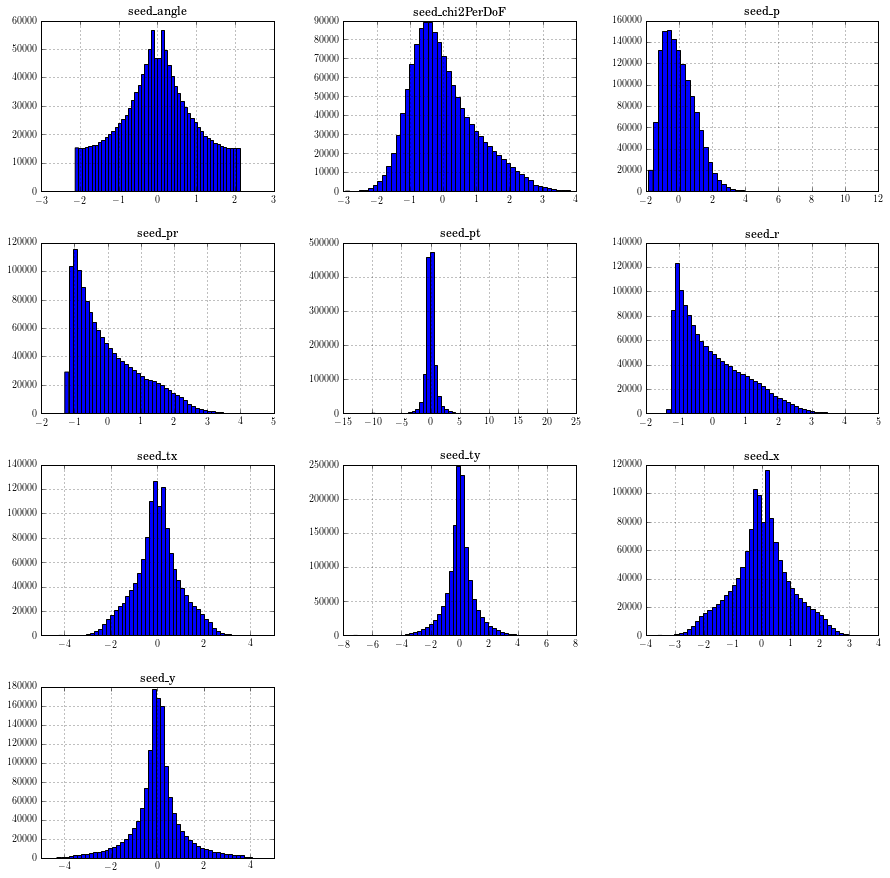

In [14]:
data_renamed_columns = {column:column.replace("_", "\_") for column in x_train.columns}
plt.rc('text', usetex=True)
plt.rc('font', family='serif')
x_train.rename(columns=data_renamed_columns).hist(bins=50, figsize=(15,15))
# plt.savefig('features_scaled_hist.eps')

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f98b71272e8>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x7f98b5431a90>]], dtype=object)

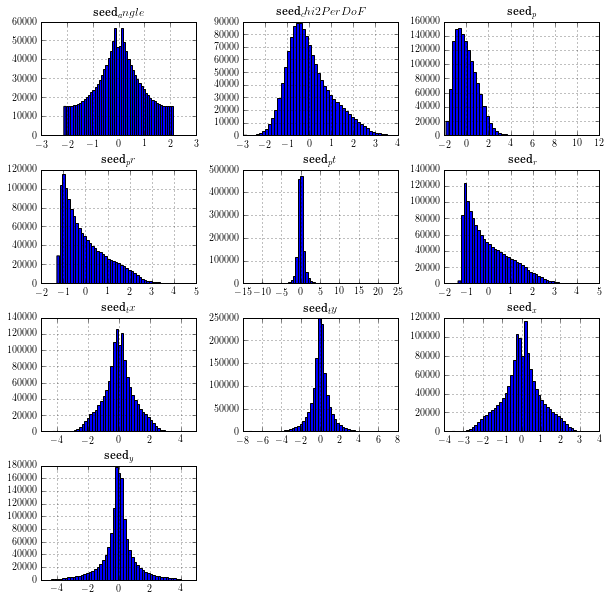

In [15]:
x_train.hist(bins=50, figsize=(10,10))

In [16]:
x_train.mean()

seed_chi2PerDoF    6.351077e-07
seed_p            -1.311259e-06
seed_pt            1.804929e-06
seed_x            -9.468086e-09
seed_y            -2.489535e-09
seed_tx           -1.257864e-08
seed_ty            7.083393e-09
seed_angle         1.408684e-08
seed_pr           -5.485245e-08
seed_r            -7.954728e-08
dtype: float32

In [17]:
x_test.mean()

seed_chi2PerDoF    0.000282
seed_p            -0.000365
seed_pt            0.002361
seed_x            -0.001611
seed_y             0.000366
seed_tx           -0.001950
seed_ty            0.000219
seed_angle         0.000350
seed_pr            0.001221
seed_r             0.001036
dtype: float32

In [18]:
# x_test.sample(frac=0.05).iplot(kind='hist', bins=50)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f98b53c7cf8>]], dtype=object)

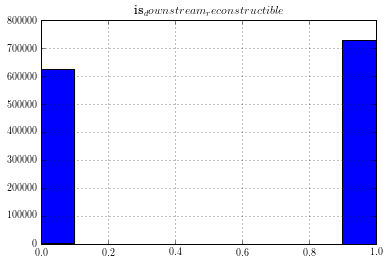

In [19]:
y_train.hist()

In [20]:
# y_test.hist()

In [21]:
from sklearn.utils import class_weight

class_weight = class_weight.compute_class_weight('balanced', np.unique(y_train['is_downstream_reconstructible']), y_train['is_downstream_reconstructible'])

In [ ]:
from keras.callbacks import TensorBoard
from models import KerasDNN
import time
import keras


date_created = time.ctime()

DNNclf = KerasDNN(
    (x_train.shape[1],),
    (1,),
    neurons=124,
    layers=10,
    dropout=0.05,
    loss_metric='binary_crossentropy',
    metrics=['accuracy'],
    last_layer_act='sigmoid',
    kernel_initializer='he_normal',
    optimizer='adam',
    batch_norm=False,
    activation='selu',
)



Using TensorFlow backend.


In [ ]:
DNNclf.fit(
    x_train.values, y_train.values,
    epochs=200,
    validation_data=(x_test.values, y_test.values),
    class_weight=class_weight,
    batch_size=1000,
    callbacks=[
        TensorBoard(
            log_dir=f'./logs/{date_created}',
            histogram_freq=1,
            batch_size=1000,
            write_graph=True,
            write_grads=True,
        )
    ]
)

Train on 1352512 samples, validate on 338128 samples
Epoch 1/200
1352512/1352512 [==============================] - 104s - loss: 0.4197 - acc: 0.8136 - val_loss: 0.3547 - val_acc: 0.8491
Epoch 2/200
1352512/1352512 [==============================] - 96s - loss: 0.3666 - acc: 0.8431 - val_loss: 0.3448 - val_acc: 0.8588
Epoch 3/200
1352512/1352512 [==============================] - 94s - loss: 0.3537 - acc: 0.8501 - val_loss: 0.3360 - val_acc: 0.8591
Epoch 4/200
1352512/1352512 [==============================] - 99s - loss: 0.3460 - acc: 0.8542 - val_loss: 0.3233 - val_acc: 0.8661
Epoch 5/200
1352512/1352512 [==============================] - 90s - loss: 0.3400 - acc: 0.8570 - val_loss: 0.3241 - val_acc: 0.8644
Epoch 6/200
1352512/1352512 [==============================] - 90s - loss: 0.3357 - acc: 0.8598 - val_loss: 0.3240 - val_acc: 0.8661
Epoch 7/200
1352512/1352512 [==============================] - 113s - loss: 0.3321 - acc: 0.8612 - val_loss: 0.3173 - val_acc: 0.8684
Epoch 8/200
13

In [ ]:
history = DNNclf.model.history

In [ ]:
DNNclf.model.summary(line_length=100)

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper right')
# plt.savefig('loss.eps')

In [ ]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='lower right')
# plt.savefig('acc.eps')

### Quick evaluation

In [ ]:
predictions = DNNclf.predict_proba(x_test.values)

In [ ]:
predictions_df = pd.DataFrame(predictions, columns=y_test.columns, index=y_test.index)

In [ ]:
predictions_df.head()

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
%time accuracy_score(y_train.values,  DNNclf.predict_proba(x_train.values) > 0.5)

In [ ]:
%time accuracy_score(y_test.values, predictions_df.values> 0.5)

In [ ]:
from sklearn.metrics import roc_auc_score

In [ ]:
roc_auc_score(y_train.values, DNNclf.predict_proba(x_train.values))

In [ ]:
roc_auc_score(y_test.values, predictions_df.values)

In [ ]:
from sklearn.metrics import log_loss

In [ ]:
log_loss(y_train.values, DNNclf.predict_proba(x_train.values))

In [ ]:
log_loss(y_test.values, DNNclf.predict_proba(x_test.values))

In [ ]:
from utils import plot_roc_curve, plot_true_positives_and_negatives, plot_confusion_matrix
from sklearn.metrics import roc_curve, confusion_matrix, accuracy_score

In [ ]:
# test
plot_confusion_matrix(
    confusion_matrix(y_test.values, np.array(predictions_df.values > 0.5, dtype=np.int32)),
    classes=["ghost","seed"],
    title='Normalized confusion matrix - DNN',
    normalize=True
)

In [ ]:
# train
plot_confusion_matrix(
    confusion_matrix(y_train.values, np.array(DNNclf.model.predict(x_train.values) > 0.5, dtype=np.int32)),
    classes=["ghost","seed"],
    title='Normalized confusion matrix - DNN',
    normalize=True
)

In [ ]:
%autoreload 2
def plot_true_positives_and_negatives(
        y_true,
        probabilities,
        normalize=False,
        step=0.1,
        title='True positives and true negatives vs threshold', ):

    thresholds = np.arange(0.0, 1.0, step)
    true_positives_rate = np.empty(thresholds.shape)
    true_negatives_rate = np.empty(thresholds.shape)
    for i, threshold in enumerate(thresholds):
        classified_examples = np.array(
            probabilities > threshold, dtype=int)
        cm = confusion_matrix(y_true, classified_examples)
        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        true_positives_rate[i] = cm[1, 1]
        true_negatives_rate[i] = cm[0, 0]

    plots = [
        go.Scatter(x=thresholds, y=true_positives_rate, name='true positives'),
        go.Scatter(x=thresholds, y=true_negatives_rate, name='true negatives'),
    ]
    layout = go.Layout(
        title=title,
        xaxis=dict(title='threshold'),
    )
    fig = go.Figure(data=plots, layout=layout)

    py.iplot(fig)
    return true_positives_rate, true_negatives_rate, thresholds

In [ ]:
# train
true_positives_rate_tr, true_negatives_rate_tr, thresholds = plot_true_positives_and_negatives(
    y_train.values, DNNclf.model.predict(x_train.values),
    title='Thresholds - DNN',
    step=1e-2,
    normalize=True
)

In [ ]:
# test
true_positives_rate, true_negatives_rate, thresholds = plot_true_positives_and_negatives(
    y_test.values, predictions_df.values,
    title='Thresholds - DNN',
    step=5e-2,
    normalize=True
)

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(thresholds, true_positives_rate_tr)
plt.plot(thresholds, true_negatives_rate_tr)
plt.plot(thresholds, true_positives_rate)
plt.plot(thresholds, true_negatives_rate)
plt.xlabel('Threshold')
plt.legend(['TP rate train', 'TN rate train', 'TP rate validation', 'TN rate validation'], loc='lower right')

In [ ]:
true_positives_rate, true_negatives_rate, thresholds

In [ ]:
x_train.mean()

In [ ]:
x_test.mean()

In [ ]:
predictions_df['correct'] = np.array( np.equal(y_test.values, predictions_df.values > 0.5))

### PIpeline info

In [ ]:
pipeline.named_steps

In [ ]:
def get_pipeline_params(pipeline):
    d = {}
    for name, step in pipeline.named_steps.items():
        try:
            d[step] = {'shift': -step.scaler.mean_[0], 'scale': 1.0/step.scaler.scale_[0]}
        except Exception as e:
                pass
            
    return d

In [ ]:
get_pipeline_params(pipeline)

### Saving model

In [ ]:
model_arch = DNNclf.model.to_json()

In [ ]:
model_dir = (MODEL_PATH / date_created).as_posix()
os.mkdir(model_dir)

In [ ]:
with (MODEL_PATH / date_created / 'architecture.json').open('w') as arch_file:
    arch_file.write(model_arch)

In [ ]:
DNNclf.model.save_weights(MODEL_PATH / date_created / 'weights.h5')

In [ ]:
print(date_created)